In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import os

# For seasonal decomposition
from statsmodels.tsa.seasonal import seasonal_decompose,STL
# Import additional functions needed
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox

In [55]:
import warnings
warnings.filterwarnings('ignore')

In [56]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [57]:
# assign path
path, dirs, files = next(os.walk("/content/drive/MyDrive/weatherdata_for_students/"))
file_count = len(files)
# create empty list
dataframes_list = []
dataframes_brigton_list =[]
# append datasets to the list

for i in range(file_count):
    if(files[i].startswith('colchester')):
      temp_df = pd.read_csv("/content/drive/MyDrive/weatherdata_for_students/"+files[i])
      if '0' in temp_df.columns:
        temp_df = pd.read_csv("/content/drive/MyDrive/weatherdata_for_students/"+files[i], header=1)
      dataframes_list.append(temp_df)
    else:
      temp_brighton_df = pd.read_csv("/content/drive/MyDrive/weatherdata_for_students/"+files[i])
      if '0' in temp_brighton_df.columns:
        temp_brighton_df = pd.read_csv("/content/drive/MyDrive/weatherdata_for_students/"+files[i], header=1)
      dataframes_brigton_list.append(temp_brighton_df)
colchester_weather_df=pd.concat(dataframes_list)
brighton_weather_df=pd.concat(dataframes_brigton_list)


In [58]:
brighton_weather_df.shape

(107484, 16)

In [59]:
#removing all the duplicates values depending on the Datetime Index
brighton_weather_df=brighton_weather_df[~brighton_weather_df['datetime'].duplicated(keep='first')]


In [60]:
#Finding the date Range of the data
print(brighton_weather_df['datetime'].min(), brighton_weather_df['datetime'].max())

2010-01-01T00:00:00 2024-01-06T11:00:00


In [61]:
#making the Date ad index which help us in data exploration as the slicing of data is convinent with Datetime data type.

brighton_weather_df.set_index(pd.to_datetime(brighton_weather_df['datetime']),inplace=True)
brighton_weather_df.drop('datetime',axis=1,inplace=True)
brighton_weather_df.sort_index(ascending=True,inplace=True)

In [62]:
brighton_weather_df.isna().sum()

temp                  222
dew                   241
humidity              237
precip                249
precipprob            241
preciptype          97377
snow                31072
snowdepth           31603
windspeed             229
winddir               247
sealevelpressure      480
cloudcover            252
solarradiation        294
solarenergy           328
uvindex               314
dtype: int64

In [63]:
'''Impute the missing Dates and Hours
date_range() method can be used to generate dates for a given start and end dates,
and the frequency of generated dates can be modified
reindex() method is used to reindex the old date column with the new date column, which has missing dates.'''
start = brighton_weather_df.index[0].date()
end = brighton_weather_df.index[len(brighton_weather_df)-1].date()
new_dates = pd.date_range(start=start,end=end,freq='1h')
brighton_weather_df = brighton_weather_df.reindex(new_dates)
brighton_weather_df = brighton_weather_df.rename_axis('date')
brighton_weather_df.shape

(122833, 15)

array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>], dtype=object)

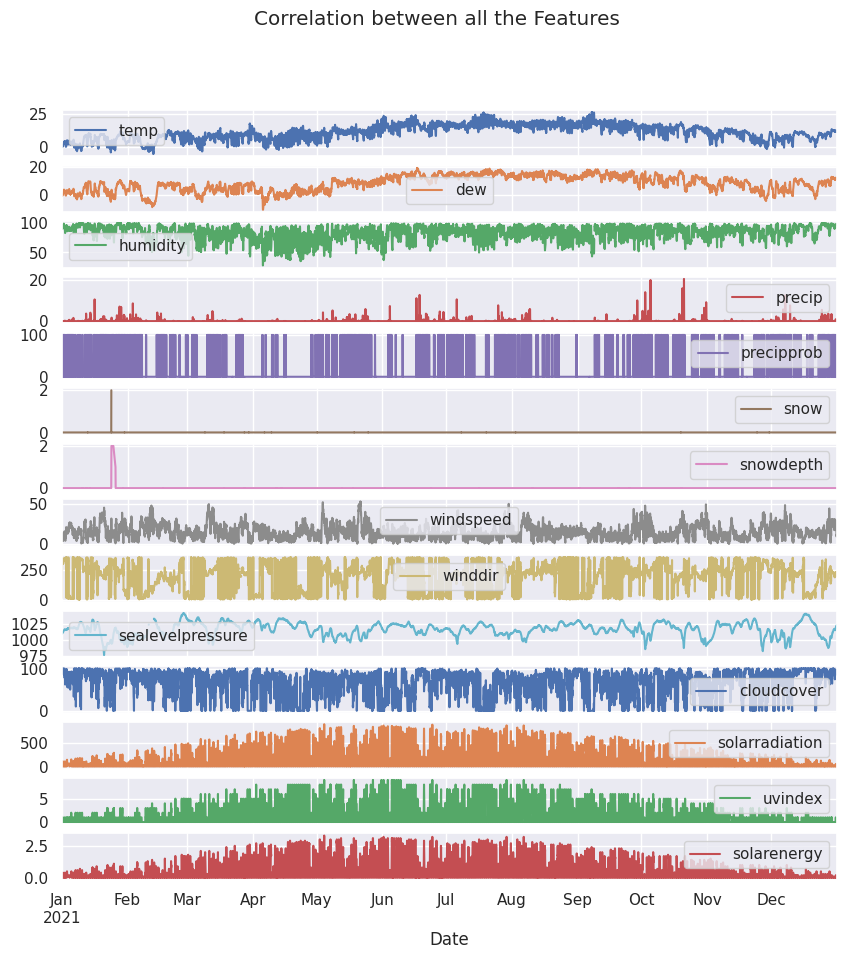

In [64]:
brighton_weather_df_selected=brighton_weather_df[['temp', 'dew', 'humidity', 'precip', 'precipprob', 'snow', 'snowdepth',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover',
       'solarradiation', 'uvindex', 'solarenergy']]

brighton_weather_df_selected.loc['2021-01':'2021-12'].plot(subplots=True,figsize=(10,10),title='Correlation between all the Features',xlabel='Date')


Text(119.44444444444444, 0.5, 'Years')

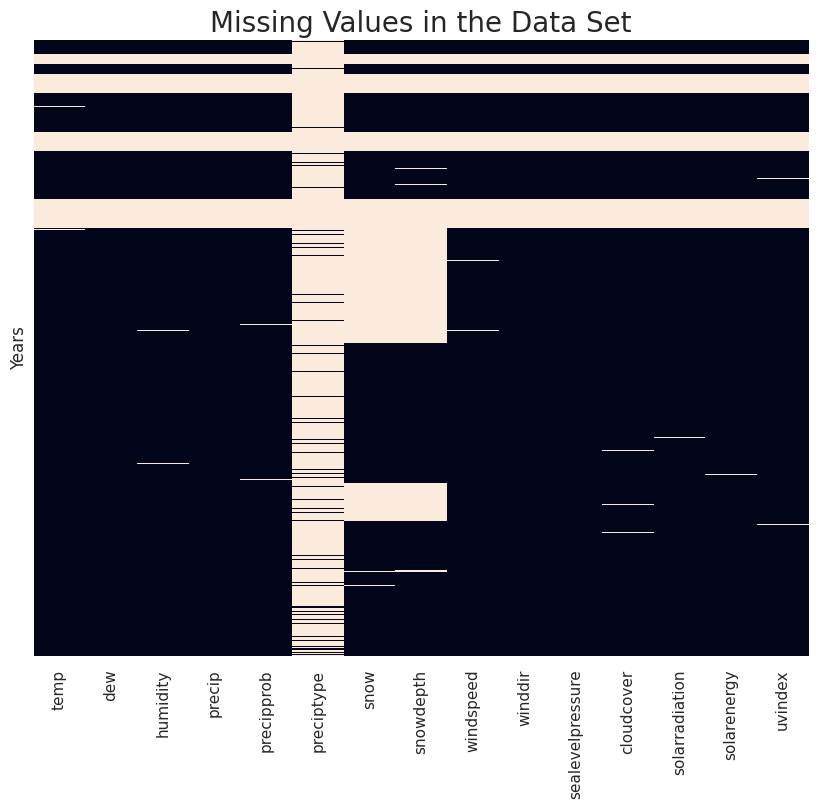

In [65]:
#ploting the missing data point in the data set
sns.set (rc = {'figure.figsize':(10, 8)})
axs=plt.axes()
sns.heatmap(brighton_weather_df.isna(),yticklabels=False,cbar=False,ax=axs)
axs.set_title('Missing Values in the Data Set',fontsize = 20)
axs.set_ylabel("Years")

In [66]:
fig = px.line(brighton_weather_df,x=brighton_weather_df.index, y='solarenergy')
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title_text='Solar Energy Over the Years', title_x=0.5)
fig.show()

In [67]:
fig = px.line(brighton_weather_df,x=brighton_weather_df.index, y='solarradiation')
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title_text='Solar Radiation Over the Years', title_x=0.5)
fig.show()

In [68]:
fig = px.line(brighton_weather_df,x=brighton_weather_df.index, y='windspeed')
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title_text='Windspeed Over the Years', title_x=0.5)
fig.show()

In [69]:
fig = px.line(brighton_weather_df,x=brighton_weather_df.index, y='temp')
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(title_text='Tempature Over the Years', title_x=0.5)
fig.show()

In [70]:
brighton_weather_df.isna().sum()

temp                 15594
dew                  15613
humidity             15609
precip               15610
precipprob           15613
preciptype          112738
snow                 46433
snowdepth            46964
windspeed            15601
winddir              15619
sealevelpressure     15852
cloudcover           15624
solarradiation       15666
solarenergy          15700
uvindex              15686
dtype: int64

In [71]:
#Dropping the preciptype,snow,snowdepth as it has more than 50% missing data hence wonot be useful for predictions.
brighton_weather_df.drop('preciptype',axis=1,inplace=True)
brighton_weather_df.drop('snow',axis=1,inplace=True)
brighton_weather_df.drop('snowdepth',axis=1,inplace=True)

In [72]:
#split the data set into train and test avoiding big chunck of missing data
df_train_val = brighton_weather_df.loc['2015':'2022']
#print the number of missing value
print(df_train_val.isna().sum())

df_test=brighton_weather_df.loc['2023':]
print(df_test.isna().sum())

temp                156
dew                 161
humidity            161
precip              168
precipprob          159
windspeed           161
winddir             168
sealevelpressure    378
cloudcover          170
solarradiation      193
solarenergy         200
uvindex             205
dtype: int64
temp                18
dew                 19
humidity            21
precip              21
precipprob          20
windspeed           21
winddir             28
sealevelpressure    14
cloudcover          24
solarradiation      51
solarenergy         64
uvindex             59
dtype: int64


In [73]:
#Find the trend of the missing data and deciding on the method to fill the data
df_test.query('temp!=temp')

,temp,dew,humidity,precip,precipprob,windspeed,winddir,sealevelpressure,cloudcover,solarradiation,solarenergy,uvindex
date,,,,,,,,,,,,
2023-01-05 03:00:00,NaN,8.7,90.69,0.000,0.0,10.6,249.0,1021.5,79.1,0.0,0.0,0.0
2023-02-04 11:00:00,NaN,6.3,81.06,0.000,0.0,10.6,281.0,1039.0,100.0,139.0,0.5,1.0
2023-02-22 15:00:00,NaN,8.2,92.63,0.000,0.0,7.2,303.0,1011.4,99.2,62.0,0.2,1.0
2023-02-23 09:00:00,NaN,5.3,89.29,0.000,0.0,14.8,21.0,1016.8,99.2,73.0,0.3,1.0
2023-03-06 22:00:00,NaN,4.3,92.31,0.000,0.0,15.3,257.0,1002.9,94.1,0.0,NaN,0.0
2023-03-17 01:00:00,NaN,8.9,93.69,0.000,0.0,11.3,219.0,1004.6,94.1,0.0,0.0,0.0
2023-03-18 00:00:00,NaN,8.5,92.31,0.026,100.0,7.7,169.0,1005.5,77.8,0.0,0.0,0.0
2023-03-23 23:00:00,NaN,9.0,96.23,0.025,100.0,28.5,239.0,996.4,99.2,0.0,0.0,0.0
2023-03-26 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
#Missing Data was Spares and since the data had Seasonality I decided to fill the data using Forward Fill method

df_train_val.ffill(inplace=True)
df_train_val.ffill(inplace=True)


Text(0.5, 1.0, 'Plot Displays the Autocorrelation in Temprature')

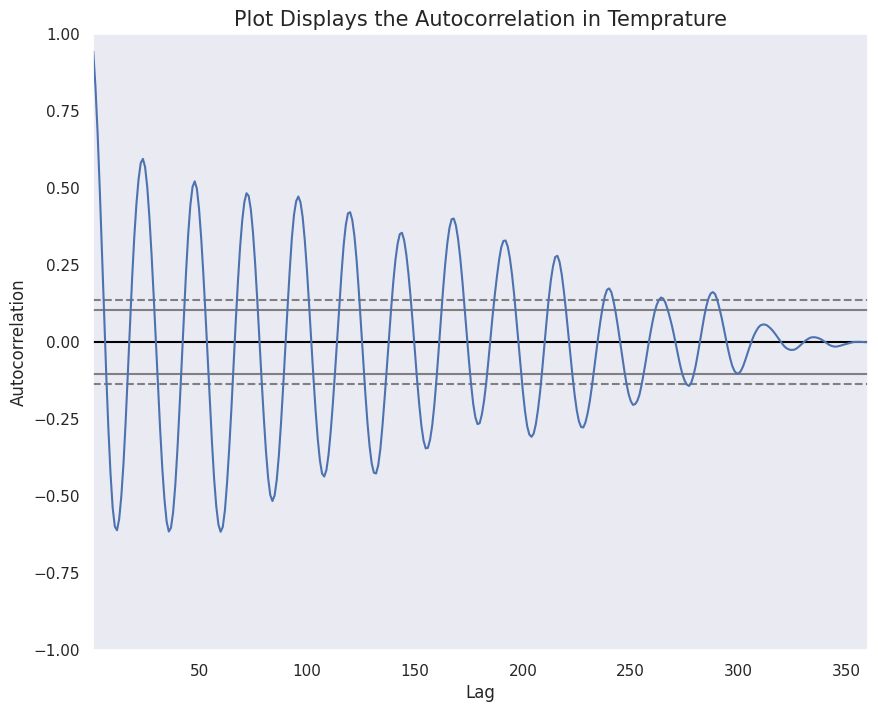

In [75]:
#Below Plot shows the temparture data is autocorrelated its stationary
pd.plotting.autocorrelation_plot(df_train_val.loc['2018-06-01':'2018-06-15','temp'])
plt.title('Plot Displays the Autocorrelation in Temprature',{'fontsize' : 15})

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

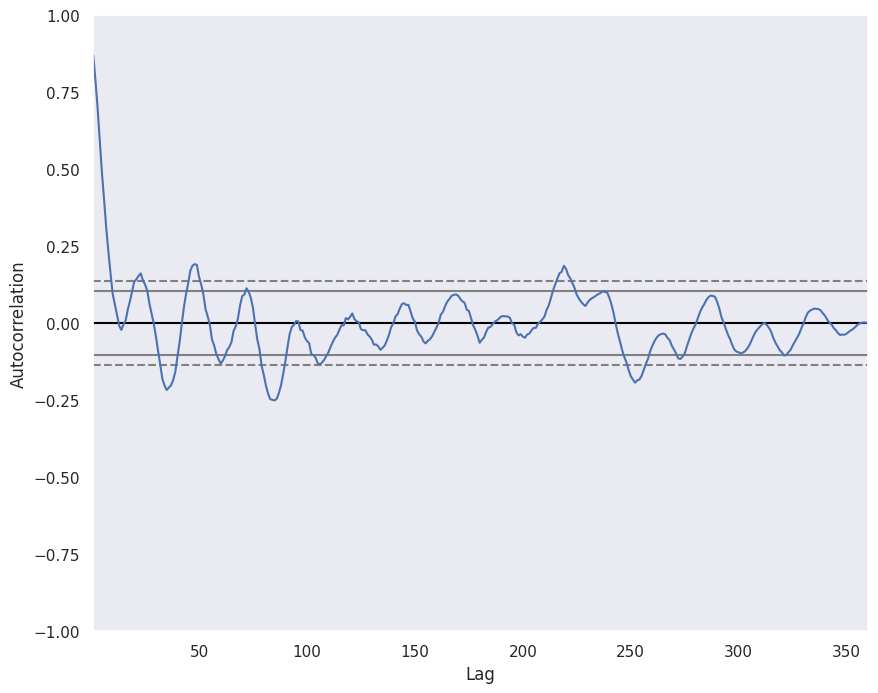

In [76]:
#No Specific auto Correlation was found for the windspeed
pd.plotting.autocorrelation_plot(df_train_val.loc['2018-06-01':'2018-06-15','windspeed'])

Text(0.5, 1.0, 'Plot Displays the Autocorrelation in the Solar Energy')

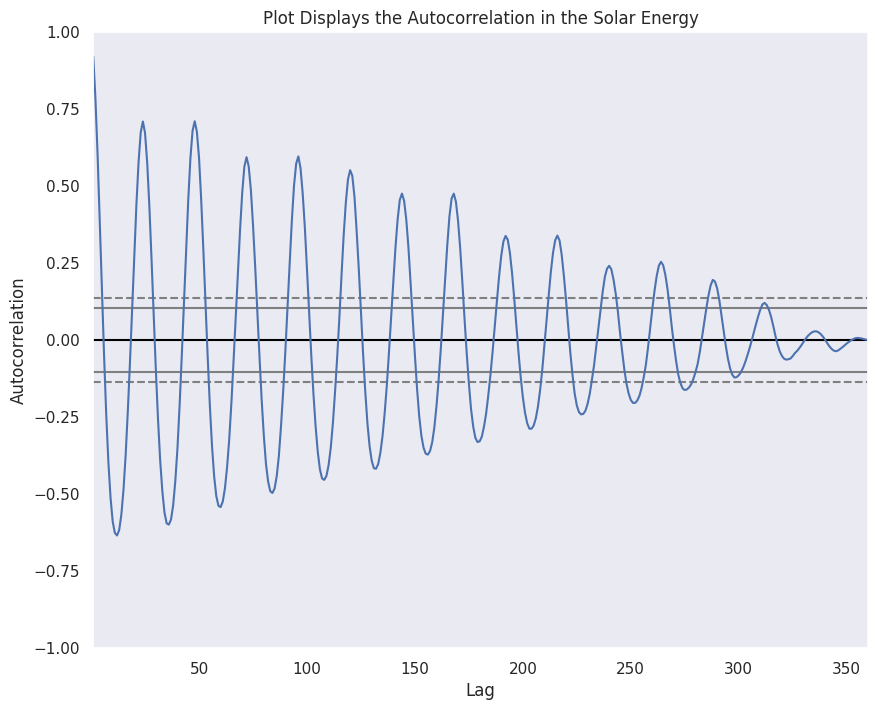

In [77]:
#Below Plot shows the temparture data is autocorrelated its stationary

pd.plotting.autocorrelation_plot(df_train_val.loc['2018-06-01':'2018-06-15','solarenergy'])
plt.title('Plot Displays the Autocorrelation in the Solar Energy')

Text(0.5, 1.0, 'Plot Displays the Autocorrelation in the Solar Radiation with a lag of an Hour')

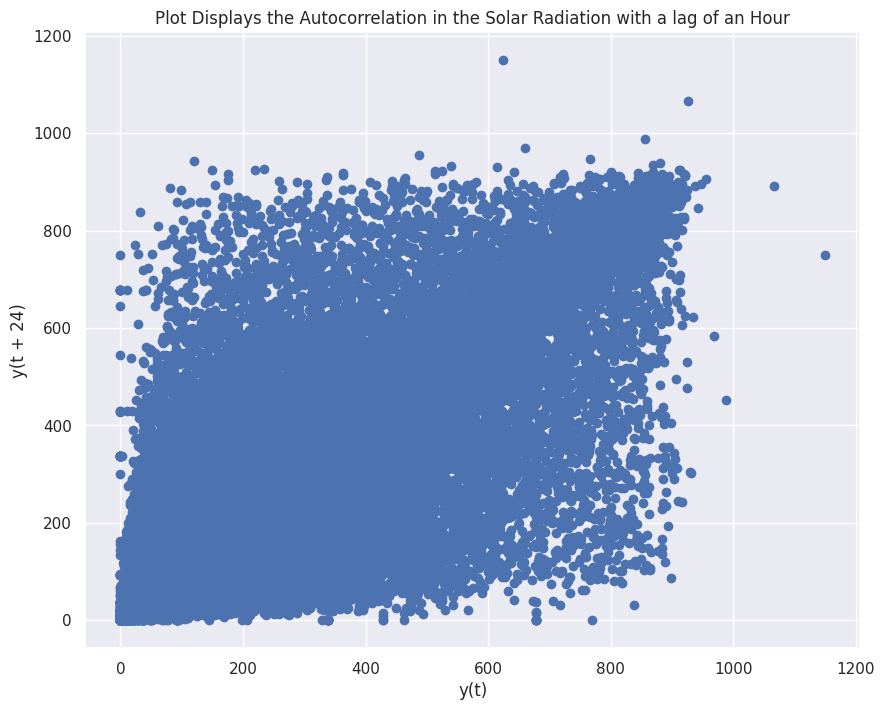

In [78]:
pd.plotting.lag_plot(df_train_val['solarradiation'],lag=24)
plt.title('Plot Displays the Autocorrelation in the Solar Radiation with a lag of an Hour')

Text(0.5, 1.0, 'Plot Displays the Autocorrelation in the WindSpeed with a lag of an Hour')

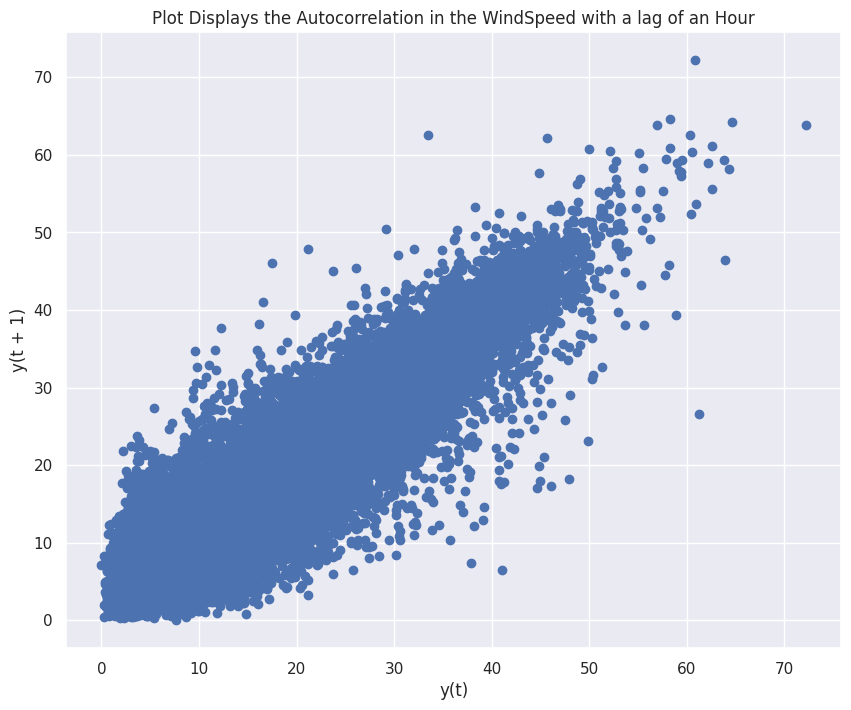

In [79]:
pd.plotting.lag_plot(df_train_val['windspeed'],lag=1)
plt.title('Plot Displays the Autocorrelation in the WindSpeed with a lag of an Hour')

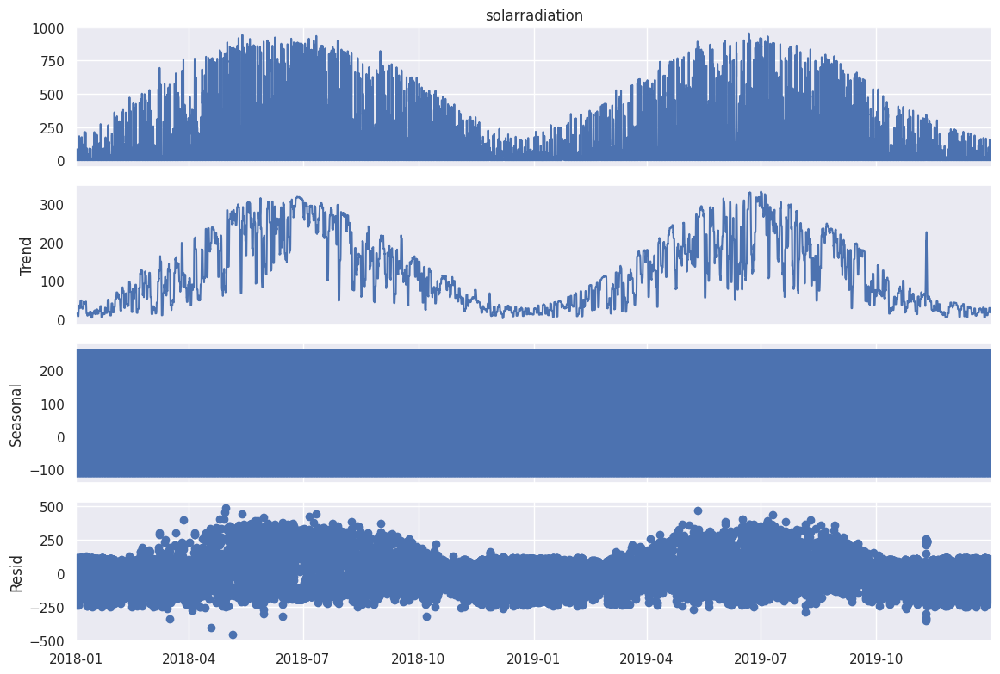

In [80]:
# Try decomposition on the resampled dataset
decomposition = seasonal_decompose(df_train_val.loc['2018':'2019','solarradiation'])
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid()

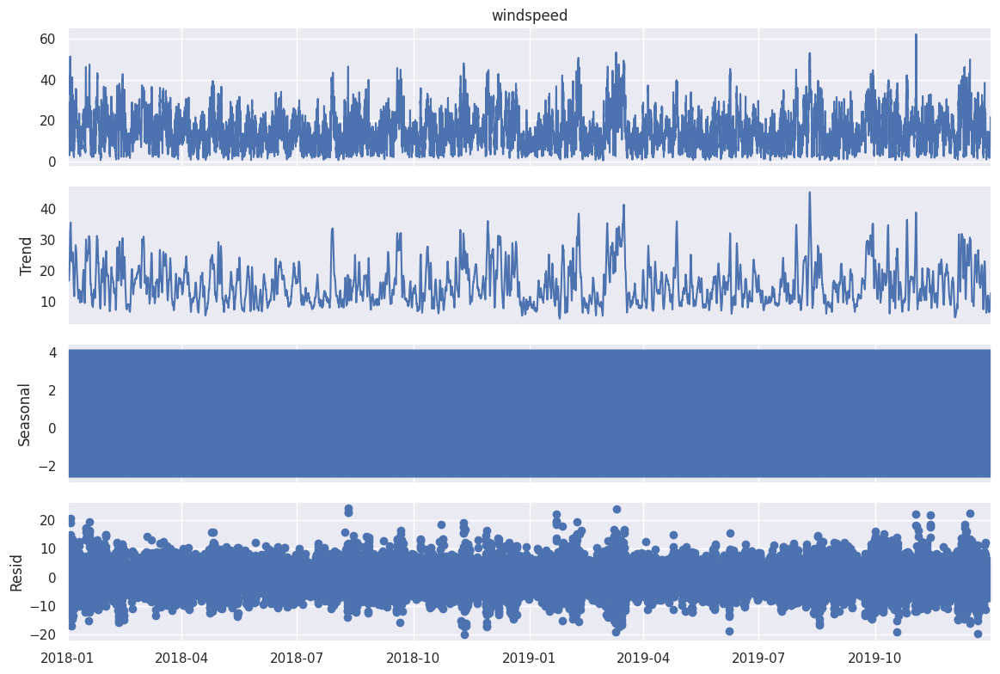

In [81]:
# Try decomposition on the resampled dataset
decomposition = seasonal_decompose(df_train_val.loc['2018':'2019','windspeed'])
fig = decomposition.plot()
fig.set_size_inches(12,8)
fig.axes[1].grid()

In [82]:
#KPSS Test to find the if the data is Stationary or not.
# Statistical test for stationarity: Augmented Dickey-Fuller (ADF) test
def kpss_test(series, **kw):
    statistic, p_value, n_lags, critical_values = kpss(series, **kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary\n')

kpss_test(df_train_val['temp'])
kpss_test(df_train_val['windspeed'])
kpss_test(df_train_val['solarenergy'])
# p-value << 0.05 ==> timeseries does not have a unit root
#The test says the p-value is significant (with p_value < 0.05) and hence,
#you can reject the null hypothesis (series is stationary) and derive that the series is NOT stationary.

KPSS Statistic: 0.36639311207098674
p-value: 0.09164089996940226
num lags: 143
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is stationary

KPSS Statistic: 0.3347716038450836
p-value: 0.1
num lags: 132
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is stationary

KPSS Statistic: 3.9666405393196134
p-value: 0.01
num lags: 53
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary



In [83]:
#The standard(link is external) density of air is 1.225 kg/m3
#The turbine has a 24 m diameter, which means the radius is 12 m. Thus, the swept area of the turbine is: (pi)r2 = 3.14159(122) = 452.4 m2
#assume a common value for the power coefficient, typically around 0.35, and use a standard air density (ρ) of approximately 1.225 kg/m^3 at sea level and 15°C.
#reference for the formula https://www.e-education.psu.edu/emsc297/node/649

df_train_val['windpower'] = round(((np.power((df_train_val['windspeed']/3.6),3))*0.5*1.225*452.4)/1000,2)*100

In [84]:
#Let's assume a solar panel efficiency of 17% (0.17) and consider the conversion for one hour of sunlight
#So, to convert solar energy from MJ/m^2 to kW, you would multiply by approximately 0.04722
#Considering 50 solar panels in Colchester
df_train_val['solarpower'] = round((df_train_val['solarenergy']*0.04722),2)*50000


https://www.brighton-hove.gov.uk/files/sites/bhconnected/files/2011%20Census%20Briefing%20-%20City%20Profile.pdf

https://www.utilitybidder.co.uk/compare-business-energy/what-is-the-average-household-energy-usage/

This article states that the average energy consumtion in Uk household is between 8.5-10kWh per day.

Suppose We have 100000 houses in Brighton and cosuming 10 KWH of electricity in day on an average
This will help me get the average Electricity per day as 1000000 KWH
